In [1]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import cv2
import torchvision

In [2]:
print("PyTorch version:", torch.__version__)
print("Torchvision version:", torchvision.__version__)
print("CUDA is available:", torch.cuda.is_available())


PyTorch version: 2.5.1+cu124
Torchvision version: 0.20.1+cu124
CUDA is available: True


In [3]:
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)
    
def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)   
    
def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0,0,0,0), lw=2))   

In [4]:
image = cv2.imread('Dataset/Corner-kick/ck.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

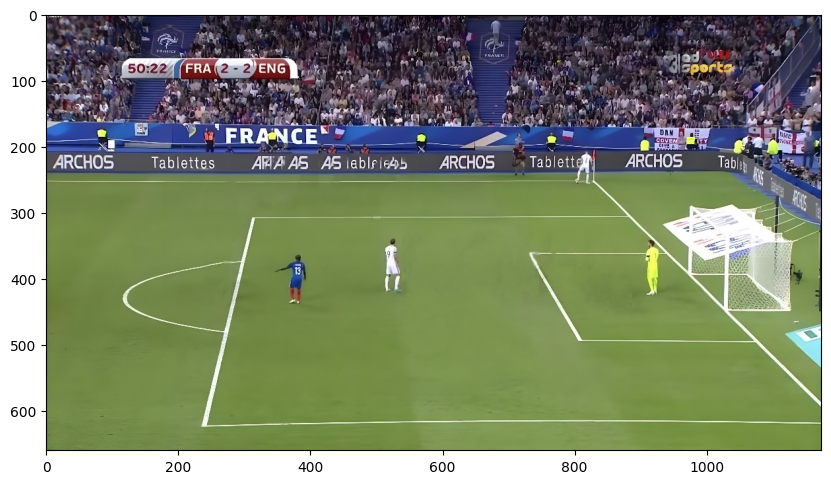

In [5]:
plt.figure(figsize=(10,10))
plt.imshow(image)
plt.axis('on')
plt.show()

In [6]:

from segment_anything import sam_model_registry, SamPredictor

sam_checkpoint = "sam_vit_h_4b8939.pth"
model_type = "vit_h"

device = "cuda"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)

predictor = SamPredictor(sam)

d:\yutol\Capstone\T2I-soccer-cornerkick-freekick\T2IEnv\Lib\site-packages\segment_anything\build_sam.py:105: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch

In [7]:
predictor.set_image(image)

In [8]:
image.shape

(660, 1174, 3)

In [262]:
input_point = np.array([[378, 398]])
input_label = np.array([1])

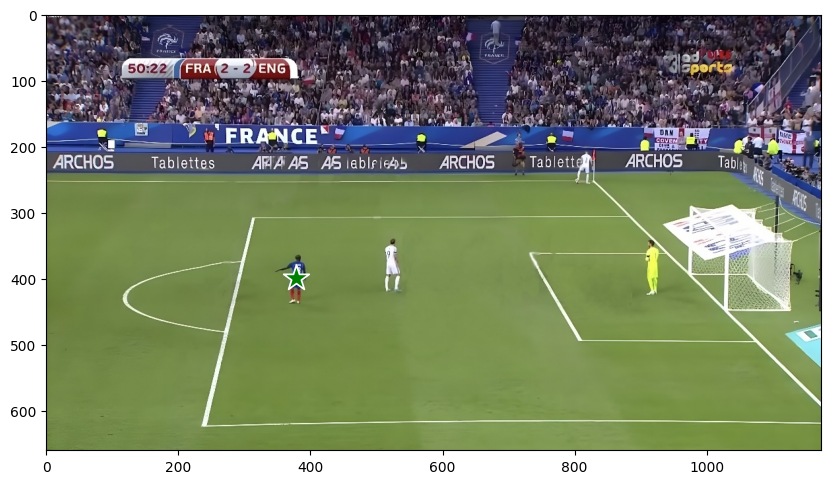

In [263]:
plt.figure(figsize=(10,10))
plt.imshow(image)
show_points(input_point, input_label, plt.gca())
plt.axis('on')
plt.show()  

In [264]:
masks, scores, logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    multimask_output=True,
)

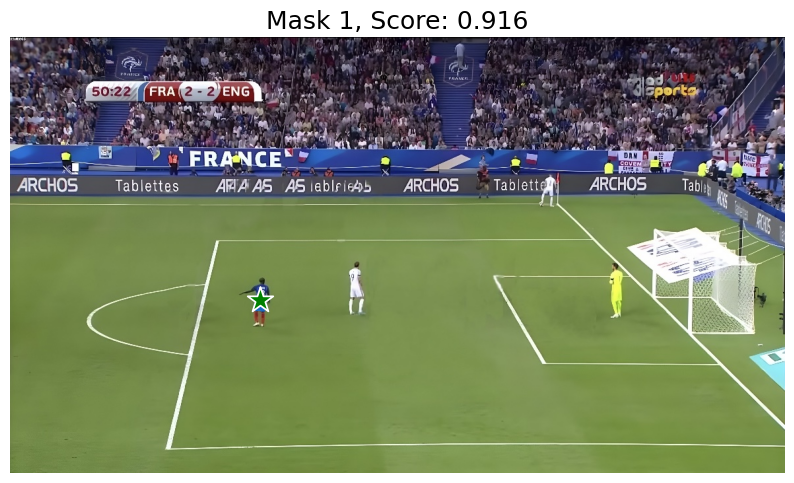

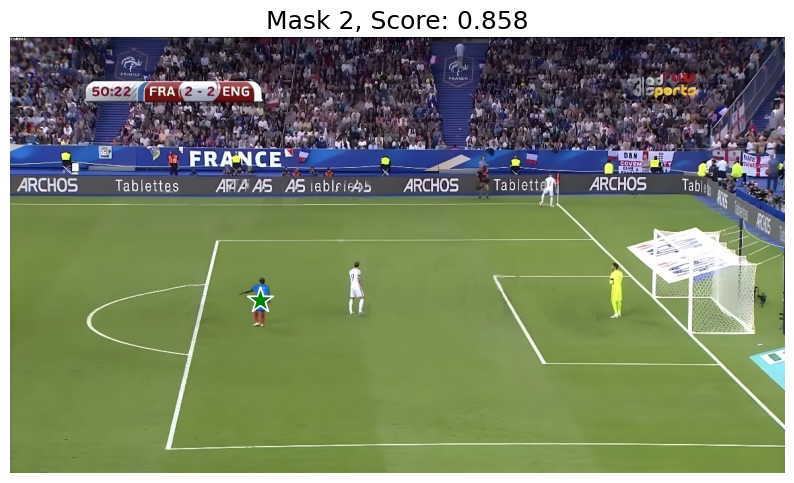

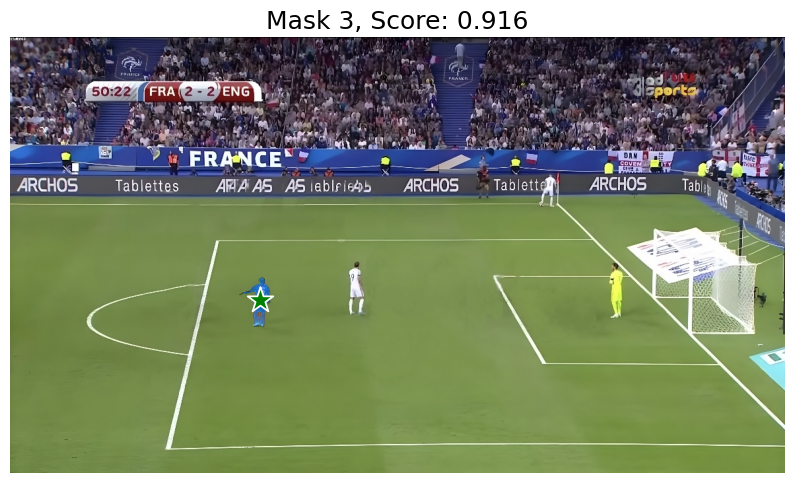

In [265]:
for i, (mask, score) in enumerate(zip(masks, scores)):
    plt.figure(figsize=(10,10))
    plt.imshow(image)
    show_mask(mask, plt.gca())
    show_points(input_point, input_label, plt.gca())
    plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
    plt.axis('off')
    plt.show()  

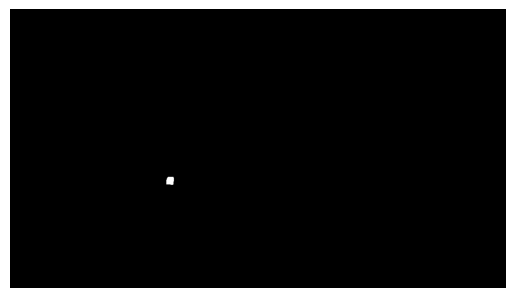

In [266]:

best_mask = masks[0]  
plt.imshow(best_mask, cmap="gray")
plt.axis("off")
plt.show()


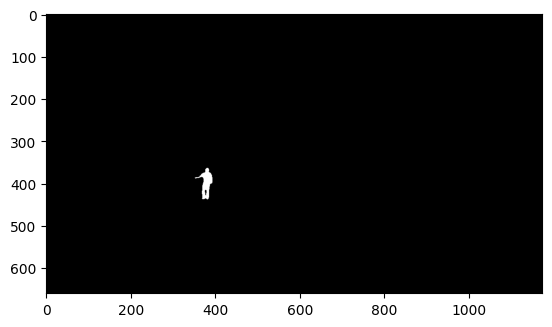

In [267]:
best_mask_idx = np.argmax(scores)
best_mask = masks[best_mask_idx]

plt.imshow(best_mask, cmap="gray")
plt.axis("on")
plt.show()

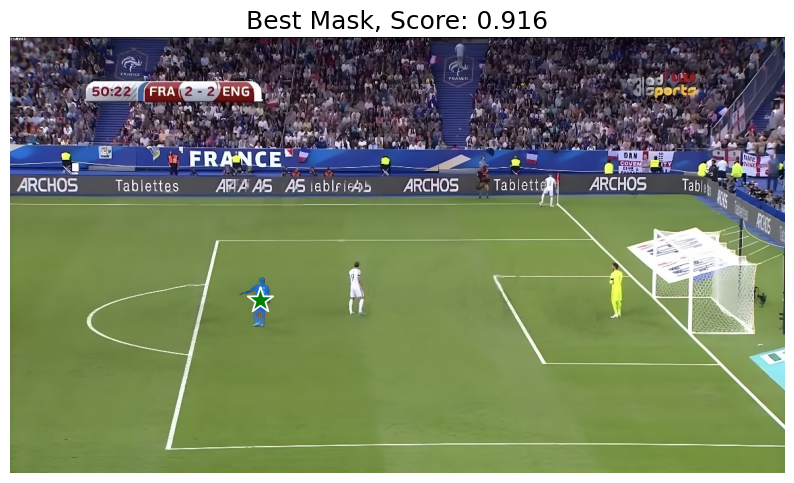

In [268]:
# Find the best mask index
best_mask_idx = np.argmax(scores)
best_mask = masks[best_mask_idx]
best_score = scores[best_mask_idx]

# Display the best mask
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_mask(best_mask, plt.gca())  # Display only the highest-scoring mask
show_points(input_point, input_label, plt.gca())  
plt.title(f"Best Mask, Score: {best_score:.3f}", fontsize=18)
plt.axis('off')
plt.show()

In [269]:
y_indices, x_indices = np.where(best_mask)
y_indices, x_indices

(array([364, 364, 364, ..., 437, 437, 438], shape=(1283,)),
 array([380, 381, 382, ..., 382, 383, 382], shape=(1283,)))

In [270]:
# Find the best mask index
best_mask_idx = np.argmax(scores)
best_mask = masks[best_mask_idx]
best_score = scores[best_mask_idx]

# Get the coordinate range of the mask
y_indices, x_indices = np.where(best_mask)
if len(x_indices) == 0 or len(y_indices) == 0:
    raise ValueError("Mask region is empty")

min_x, max_x = np.min(x_indices), np.max(x_indices)
min_y, max_y = np.min(y_indices), np.max(y_indices)
image_height, image_width = image.shape[:2]

dx_min, dx_max = -min_x, image_width - max_x - 1
dy_min, dy_max = -min_y, image_height - max_y - 1

dx_min

np.int64(-352)

Random displacement dx=27, dy=-244


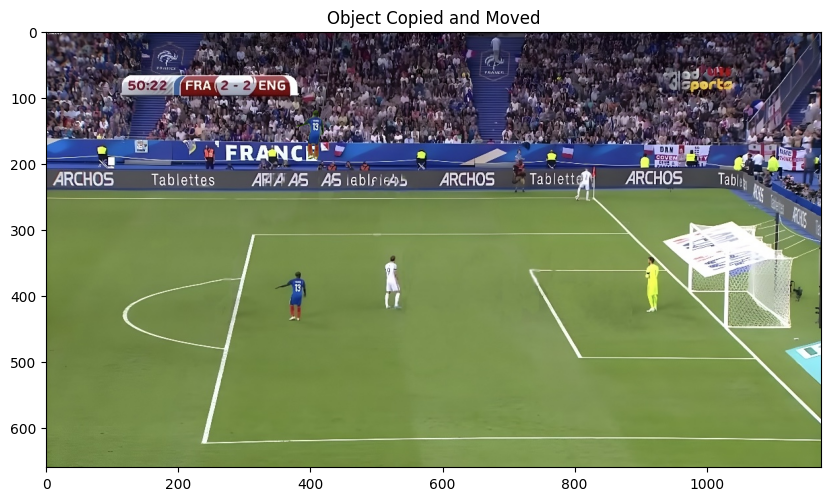

In [271]:

# Find the best mask index
best_mask_idx = np.argmax(scores)
best_mask = masks[best_mask_idx]
best_score = scores[best_mask_idx]

# Get the coordinate range of the mask
y_indices, x_indices = np.where(best_mask)
if len(x_indices) == 0 or len(y_indices) == 0:
    raise ValueError("Mask region is empty")

min_x, max_x = np.min(x_indices), np.max(x_indices)
min_y, max_y = np.min(y_indices), np.max(y_indices)
image_height, image_width = image.shape[:2]

# Compute the random displacement range
dx_min, dx_max = -min_x, image_width - max_x - 1
dy_min, dy_max = -min_y, image_height - max_y - 1

dx = np.random.randint(dx_min, dx_max + 1) if dx_min < dx_max else 0
dy = np.random.randint(dy_min, dy_max + 1) if dy_min < dy_max else 0

print(f"Random displacement dx={dx}, dy={dy}")

# Compute new position
y_indices_new = y_indices + dy
x_indices_new = x_indices + dx

# Filter valid pixels
valid = (x_indices_new >= 0) & (x_indices_new < image_width) & (y_indices_new >= 0) & (y_indices_new < image_height)
y_valid, x_valid = y_indices_new[valid], x_indices_new[valid]

# Copy and paste the object to the new location
result = image.copy()
result[y_valid, x_valid] = image[y_indices[valid], x_indices[valid]]

# Display the result
plt.figure(figsize=(10, 10))
plt.imshow(result)
plt.title("Object Copied and Moved")
plt.axis('on')
plt.show()


Player 1 random displacement: dx=402, dy=-205
Player 2 random displacement: dx=699, dy=211
Player 3 random displacement: dx=-84, dy=178
Player 4 random displacement: dx=755, dy=-362
Player 5 random displacement: dx=-177, dy=-226
Player 6 random displacement: dx=101, dy=153
Player 7 random displacement: dx=-136, dy=-318
Player 8 random displacement: dx=609, dy=172
Player 9 random displacement: dx=102, dy=75


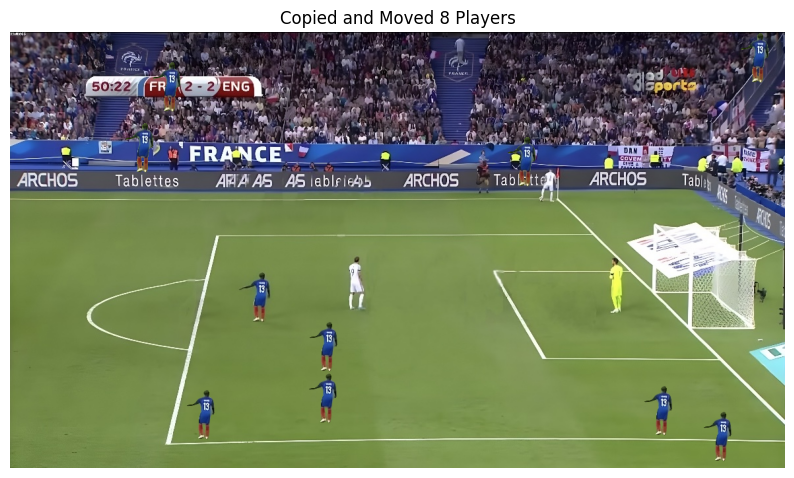

In [272]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

# Find the best mask index
best_mask_idx = np.argmax(scores)
best_mask = masks[best_mask_idx]
best_score = scores[best_mask_idx]

# Get the coordinate range of the mask
y_indices, x_indices = np.where(best_mask)
if len(x_indices) == 0 or len(y_indices) == 0:
    raise ValueError("Mask region is empty")

min_x, max_x = np.min(x_indices), np.max(x_indices)
min_y, max_y = np.min(y_indices), np.max(y_indices)
image_height, image_width = image.shape[:2]

# Compute the random displacement range
dx_min, dx_max = -min_x, image_width - max_x - 1
dy_min, dy_max = -min_y, image_height - max_y - 1

# Copy 8 players and randomly place them
num_copies = 9  # Including the original player
result = image.copy()

for i in range(num_copies):
    dx = np.random.randint(dx_min, dx_max + 1) if dx_min < dx_max else 0
    dy = np.random.randint(dy_min, dy_max + 1) if dy_min < dy_max else 0

    print(f"Player {i+1} random displacement: dx={dx}, dy={dy}")

    # Compute new position
    y_indices_new = y_indices + dy
    x_indices_new = x_indices + dx

    # Filter valid pixels
    valid = (x_indices_new >= 0) & (x_indices_new < image_width) & (y_indices_new >= 0) & (y_indices_new < image_height)
    y_valid, x_valid = y_indices_new[valid], x_indices_new[valid]

    # Copy and paste to the new location
    result[y_valid, x_valid] = image[y_indices[valid], x_indices[valid]]

# Display the result
plt.figure(figsize=(10, 10))
plt.imshow(result)
plt.title("Copied and Moved 8 Players")
plt.axis('off')
plt.show()


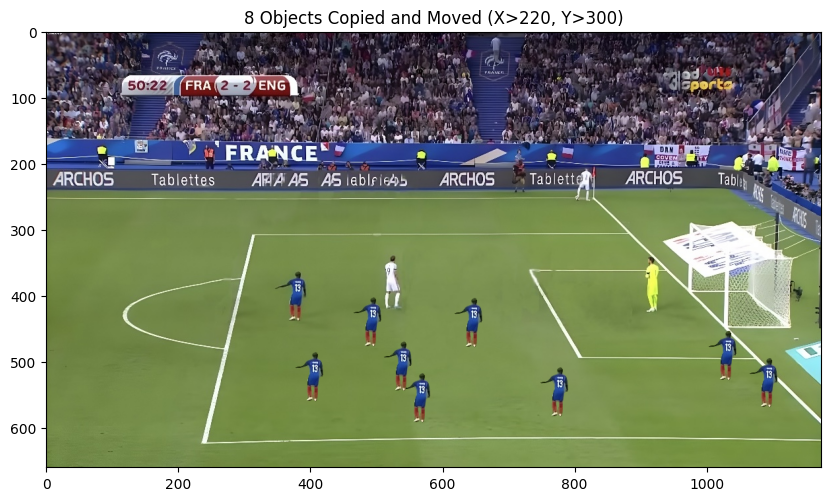

In [273]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

# Find the best mask index
best_mask_idx = np.argmax(scores)
best_mask = masks[best_mask_idx]
best_score = scores[best_mask_idx]

# Get the coordinate range of the mask
y_indices, x_indices = np.where(best_mask)
if len(x_indices) == 0 or len(y_indices) == 0:
    raise ValueError("Mask area is empty")

min_x, max_x = np.min(x_indices), np.max(x_indices)
min_y, max_y = np.min(y_indices), np.max(y_indices)
image_height, image_width = image.shape[:2]

# Compute valid displacement range to ensure X > 220, Y > 300
dx_min = max(220 - min_x, 0)  # Ensure the new X position is greater than 220
dx_max = image_width - max_x - 1  # Ensure it does not exceed the right boundary

dy_min = max(300 - min_y, 0)  # Ensure the new Y position is greater than 300
dy_max = image_height - max_y - 1  # Ensure it does not exceed the bottom boundary

# Copy and randomly move multiple players
num_players = 8
result = image.copy()

for _ in range(num_players):
    # Randomly generate displacement values while ensuring constraints
    dx = np.random.randint(dx_min, dx_max + 1) if dx_min < dx_max else 0
    dy = np.random.randint(dy_min, dy_max + 1) if dy_min < dy_max else 0

    # Compute new positions
    y_indices_new = y_indices + dy
    x_indices_new = x_indices + dx

    # Filter valid pixel positions
    valid = (x_indices_new >= 0) & (x_indices_new < image_width) & (y_indices_new >= 0) & (y_indices_new < image_height)
    y_valid, x_valid = y_indices_new[valid], x_indices_new[valid]

    # Copy and paste the object to the new position
    result[y_valid, x_valid] = image[y_indices[valid], x_indices[valid]]

# Display the result
plt.figure(figsize=(10, 10))
plt.imshow(result)
plt.title(f"{num_players} Objects Copied and Moved (X>220, Y>300)")
plt.axis('on')
plt.show()


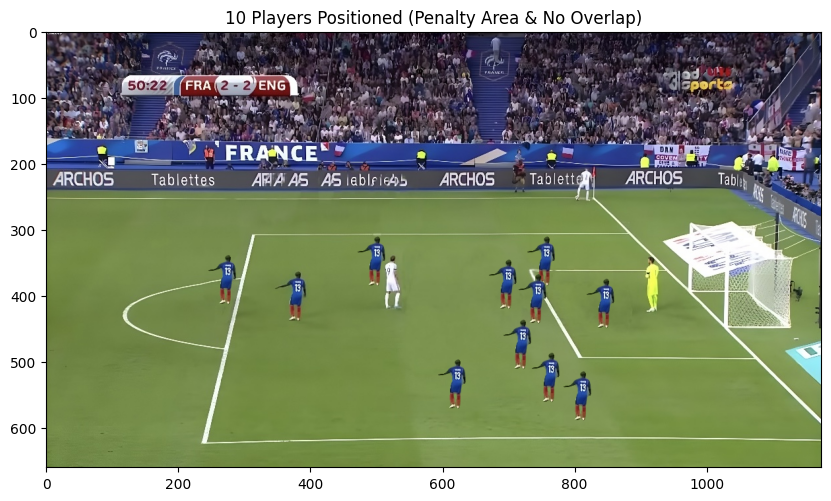

In [274]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

# Find the best mask index
best_mask_idx = np.argmax(scores)
best_mask = masks[best_mask_idx]
best_score = scores[best_mask_idx]

# Get the coordinate range of the mask
y_indices, x_indices = np.where(best_mask)
if len(x_indices) == 0 or len(y_indices) == 0:
    raise ValueError("Mask area is empty")

min_x, max_x = np.min(x_indices), np.max(x_indices)
min_y, max_y = np.min(y_indices), np.max(y_indices)
image_height, image_width = image.shape[:2]

# Define the field area constraints
x_range = (220, 910)
y_range = (290, 600)

# Define penalty area constraints for most players
penalty_x_range = (650, 820)
penalty_y_range = (300, 600)

num_players = 10  
total_players = num_players
result = image.copy()

# Keep track of occupied positions to prevent overlap
occupied_positions = set()

# Function to check if the new position is overlapping
def is_overlapping(new_x, new_y, occupied_positions, tolerance=30):
    for (ox, oy) in occupied_positions:
        if abs(new_x - ox) < tolerance and abs(new_y - oy) < tolerance:
            return True
    return False

# Generate positions for players  
players_positions = []
penalty_players = 0  # Count players near the penalty area
  
i = 0
while i < num_players:
    # Ensure most players are around the penalty spot
    if penalty_players < 5:   
        dx = np.random.randint(penalty_x_range[0] - min_x, penalty_x_range[1] - max_x)
        dy = np.random.randint(penalty_y_range[0] - min_y, penalty_y_range[1] - max_y)
    else:
        dx = np.random.randint(x_range[0] - min_x, x_range[1] - max_x)
        dy = np.random.randint(y_range[0] - min_y, y_range[1] - max_y)
    
    # Ensure no overlap
    new_x, new_y = min_x + dx, min_y + dy
    if not is_overlapping(new_x, new_y, occupied_positions):
        occupied_positions.add((new_x, new_y))
        players_positions.append((dx, dy))
        penalty_players += 1 if (650 <= new_x <= 820 and 300 <= new_y <= 600) else 0
        i += 1

# Copy and paste players to new positions
for dx, dy in players_positions:
    y_indices_new = y_indices + dy
    x_indices_new = x_indices + dx

    valid = (x_indices_new >= 0) & (x_indices_new < image_width) & (y_indices_new >= 0) & (y_indices_new < image_height)
    y_valid, x_valid = y_indices_new[valid], x_indices_new[valid]

    # Copy the object to the new position
    result[y_valid, x_valid] = image[y_indices[valid], x_indices[valid]]

# Display the result
plt.figure(figsize=(10, 10))
plt.imshow(result)
plt.title(f"{num_players} Players Positioned (Penalty Area & No Overlap)")
plt.axis('on')
plt.show()

Position Adjust:

1. All players should be in the area(300 < X < 910, 300 < Y < 600)
2. Most of the players in around the penalty spot area[650 < X < 820, 300 < Y < 600] (at least 5 players each team)
3. Most of the Players from two teams should be next to each other 
4. 
5. 
6. Players cannot overlap (set a tolerance = 30)


In [275]:
input_point = np.array([[520, 378]])
input_label = np.array([1])

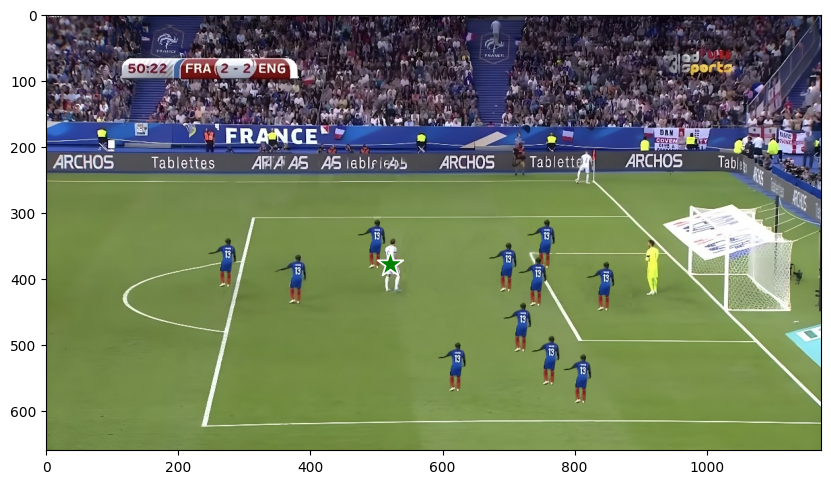

In [276]:
plt.figure(figsize=(10,10))
plt.imshow(result )
show_points(input_point, input_label, plt.gca())
plt.axis('on')
plt.show()  

In [277]:
masks, scores, logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    multimask_output=True,
)

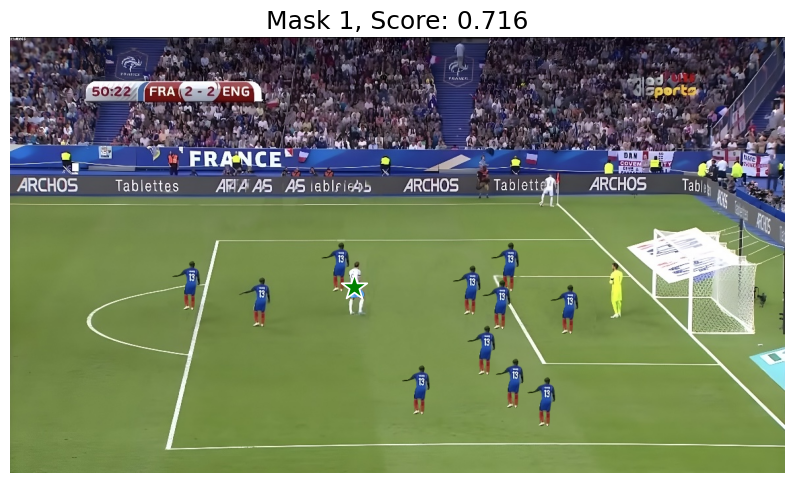

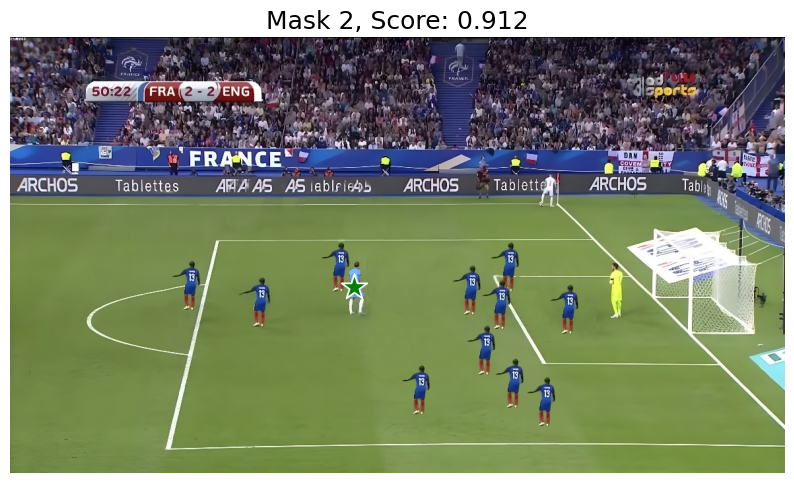

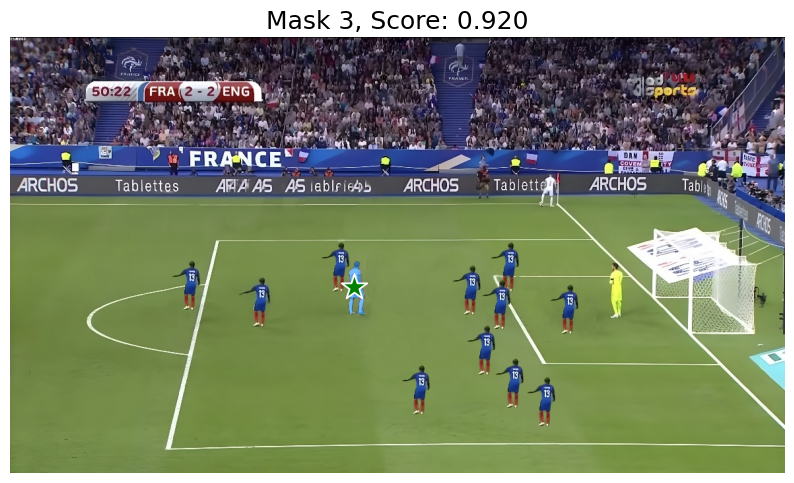

In [278]:
for i, (mask, score) in enumerate(zip(masks, scores)):
    plt.figure(figsize=(10,10))
    plt.imshow(result)
    show_mask(mask, plt.gca())
    show_points(input_point, input_label, plt.gca())
    plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
    plt.axis('off')
    plt.show()  

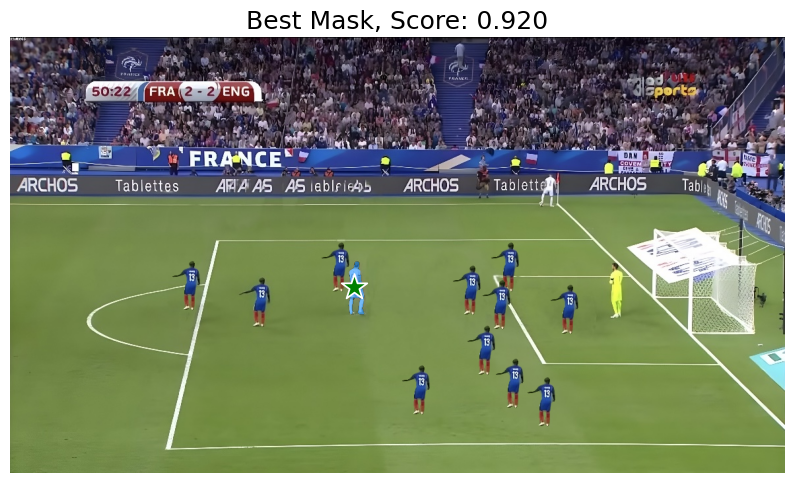

In [279]:
# 找到最佳 mask 的索引
best_mask_idx = np.argmax(scores)
best_mask = masks[best_mask_idx]
best_score = scores[best_mask_idx]

# 显示最佳 mask
plt.figure(figsize=(10,10))
plt.imshow(result)
show_mask(best_mask, plt.gca())  # 只显示最高分的 mask
show_points(input_point, input_label, plt.gca())  
plt.title(f"Best Mask, Score: {best_score:.3f}", fontsize=18)
plt.axis('off')
plt.show()


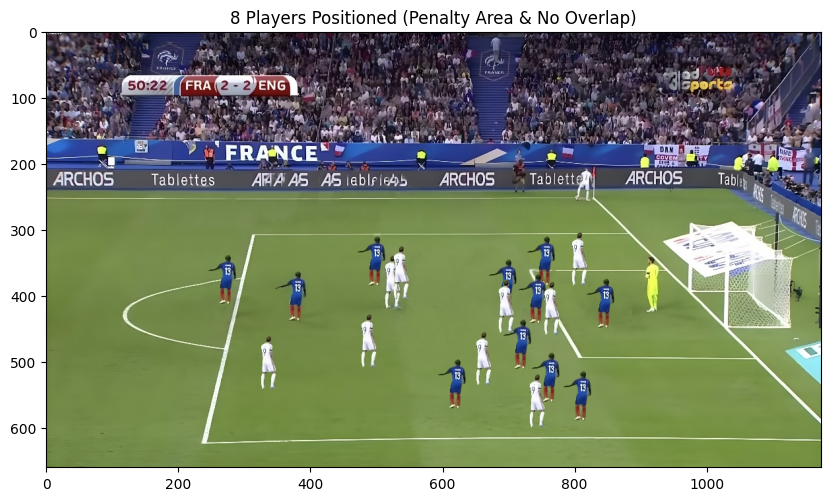

In [283]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

# Find the best mask index
best_mask_idx = np.argmax(scores)
best_mask = masks[best_mask_idx]
best_score = scores[best_mask_idx]

# Get the coordinate range of the mask
y_indices, x_indices = np.where(best_mask)
if len(x_indices) == 0 or len(y_indices) == 0:
    raise ValueError("Mask area is empty")

min_x, max_x = np.min(x_indices), np.max(x_indices)
min_y, max_y = np.min(y_indices), np.max(y_indices)
image_height, image_width = image.shape[:2]

# Define the field area constraints
x_range = (220, 910)
y_range = (290, 600)

# Define penalty area constraints for most players
penalty_x_range = (650, 820)
penalty_y_range = (300, 600)

num_players = 8
total_players = num_players
final_result = result.copy()

# Keep track of occupied positions to prevent overlap
# occupied_positions = set()

# Function to check if the new position is overlapping
def is_overlapping(new_x, new_y, occupied_positions, tolerance=30):
    for (ox, oy) in occupied_positions:
        if abs(new_x - ox) < tolerance and abs(new_y - oy) < tolerance:
            return True
    return False

# Generate positions for players  
players_positions = []
penalty_players = 0  # Count players near the penalty area
  
i = 0
while i < num_players:
    # Ensure most players are around the penalty spot
    if penalty_players < 5:   
        dx = np.random.randint(penalty_x_range[0] - min_x, penalty_x_range[1] - max_x)
        dy = np.random.randint(penalty_y_range[0] - min_y, penalty_y_range[1] - max_y)
    else:
        dx = np.random.randint(x_range[0] - min_x, x_range[1] - max_x)
        dy = np.random.randint(y_range[0] - min_y, y_range[1] - max_y)
    
    # Ensure no overlap
    new_x, new_y = min_x + dx, min_y + dy
    if not is_overlapping(new_x, new_y, occupied_positions):
        occupied_positions.add((new_x, new_y))
        players_positions.append((dx, dy))
        penalty_players += 1 if (650 <= new_x <= 820 and 300 <= new_y <= 600) else 0
        i += 1

# Copy and paste players to new positions
for dx, dy in players_positions:
    y_indices_new = y_indices + dy
    x_indices_new = x_indices + dx

    valid = (x_indices_new >= 0) & (x_indices_new < image_width) & (y_indices_new >= 0) & (y_indices_new < image_height)
    y_valid, x_valid = y_indices_new[valid], x_indices_new[valid]

    # Copy the object to the new position
    final_result[y_valid, x_valid] = image[y_indices[valid], x_indices[valid]]

# Display the final_result
plt.figure(figsize=(10, 10))
plt.imshow(final_result)
plt.title(f"{num_players} Players Positioned (Penalty Area & No Overlap)")
plt.axis('on')
plt.show()

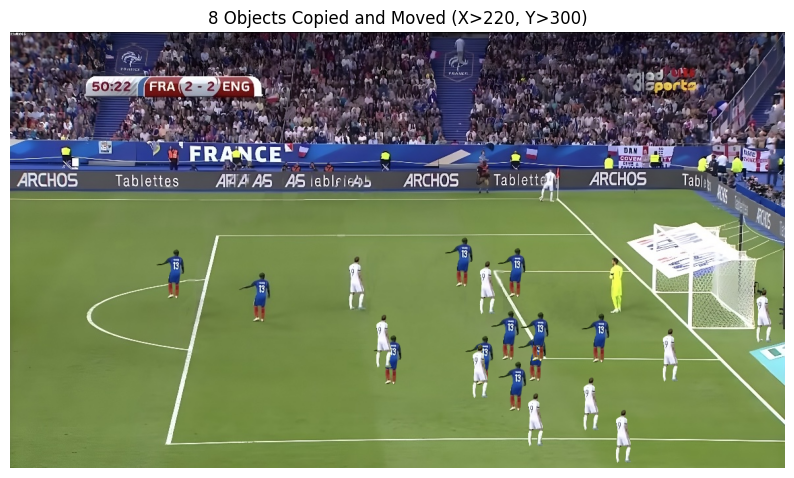

In [217]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

# Find the best mask index
best_mask_idx = np.argmax(scores)
best_mask = masks[best_mask_idx]
best_score = scores[best_mask_idx]

# Get the coordinate range of the mask
y_indices, x_indices = np.where(best_mask)
if len(x_indices) == 0 or len(y_indices) == 0:
    raise ValueError("Mask area is empty")

min_x, max_x = np.min(x_indices), np.max(x_indices)
min_y, max_y = np.min(y_indices), np.max(y_indices)
result_height, result_width = result.shape[:2]

# Compute valid displacement range to ensure X > 220, Y > 300
dx_min = max(220 - min_x, 0)  # Ensure the new X position is greater than 220
dx_max = result_width - max_x - 1  # Ensure it does not exceed the right boundary

dy_min = max(300 - min_y, 0)  # Ensure the new Y position is greater than 300
dy_max = result_height - max_y - 1  # Ensure it does not exceed the bottom boundary

# Copy and randomly move multiple players
num_players = 8
result_ = result.copy()

for _ in range(num_players):
    # Randomly generate displacement values while ensuring constraints
    dx = np.random.randint(dx_min, dx_max + 1) if dx_min < dx_max else 0
    dy = np.random.randint(dy_min, dy_max + 1) if dy_min < dy_max else 0

    # Compute new positions
    y_indices_new = y_indices + dy
    x_indices_new = x_indices + dx

    # Filter valid pixel positions
    valid = (x_indices_new >= 0) & (x_indices_new < result_width) & (y_indices_new >= 0) & (y_indices_new < result_height)
    y_valid, x_valid = y_indices_new[valid], x_indices_new[valid]

    # Copy and paste the object to the new position
    result_[y_valid, x_valid] = result[y_indices[valid], x_indices[valid]]

# Display the result
plt.figure(figsize=(10, 10))
plt.imshow(result_)
plt.title(f"{num_players} Objects Copied and Moved (X>220, Y>300)")
plt.axis('off')
plt.show()
